In [1]:
!ls -lha | grep items

-rw-rw-r--  1 s.murzakhmetov   s.murzakhmetov    11M авг 16 12:28 items checking.ipynb
-rw-rw-r--  1 s.murzakhmetov   s.murzakhmetov   1,2G авг  6 19:42 items.tsv


### data discovering part

In [304]:
import pandas as pd
from collections import OrderedDict, defaultdict
import numpy as np
import gensim
import warnings
from operator import itemgetter
from itertools import groupby
import re
import os
import psutil
import resource
from pprint import pprint
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split
import multiprocessing
from scipy.spatial.distance import cosine
from keras.preprocessing.text import one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Flatten
from keras import backend as K
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN
import matplotlib.pyplot as plt
import random
import matplotlib.cm as cm
from sklearn import metrics
from sklearn.metrics.pairwise import cosine_distances, euclidean_distances, cosine_similarity
from sklearn.decomposition import PCA
import seaborn as sns
import tqdm
from sklearn.preprocessing import OneHotEncoder
start = "\033[1m"
end = "\033[0;0m"
warnings.simplefilter('ignore')

In [253]:
def masker(array):
    masks = []
    masked_test = []
    for check in array:
        # setting seed
        random.seed(666)
        # index of random masked word
        mask_ind = random.randint(0,len(check)-1)
        # saving mask to list
        masks.append(check[mask_ind])
        # creating new test list without masked word
        masked_test.append(check[:mask_ind] + check[mask_ind +1:])
    return masked_test, masks

In [4]:
def memory_usage():
    process = psutil.Process(os.getpid())
    print(f'RAM used in GB: {start}{np.round(process.memory_info().rss/1024/1024/1024, 3)}{end}')

In [5]:
def reader(filename):
    with open(filename,'r+') as f:
        data = f.read().splitlines()
    return data

In [6]:
def get_item_name_vector(filename):
    '''
    creates dict with key = item name, value = wv vector 150 dim
    '''
    vector_dimension = 150
    raw_data = reader(filename)
    # skip first row, because of wv default output
    raw_data = raw_data[1:]
    items = {}
    for i in raw_data:
        float_part = re.findall("[-+]?[.]?[\d]+(?:,\d\d\d)*[\.]?\d*(?:[eE][-+]?\d+)?", i)
        if len(float_part) == vector_dimension:
            word_part = i[:len(i)-len(' '.join(float_part))].strip()
            items[word_part] = list(map(float, float_part))
        else:
            # if item's name contains int or float nums
            float_part = float_part[len(float_part) - vector_dimension:]
            word_part = i[:len(i)-len(' '.join(float_part))].strip()
            items[word_part] = list(map(float, float_part))
    return items

In [7]:
def tsnescatterplot(model, word, list_names):
    """ 
    Plot in seaborn the results from the t-SNE dimensionality reduction algorithm of the vectors of a query word,
    its list of most similar words, and a list of words.
    """
    arrays = np.empty((0, 150), dtype='f')
    word_labels = [word]
    color_list  = ['red']

    # adds the vector of the query word
    arrays = np.append(arrays, model.wv.__getitem__([word]), axis=0)
    
    # gets list of most similar words
    close_words = model.wv.most_similar([word])
    
    # adds the vector for each of the closest words to the array
    for wrd_score in close_words:
        wrd_vector = model.wv.__getitem__([wrd_score[0]])
        word_labels.append(wrd_score[0])
        color_list.append('blue')
        arrays = np.append(arrays, wrd_vector, axis=0)
    
    # adds the vector for each of the words from list_names to the array
    for wrd in list_names:
        wrd_vector = model.wv.__getitem__([wrd])
        word_labels.append(wrd)
        color_list.append('green')
        arrays = np.append(arrays, wrd_vector, axis=0)
        
    # Reduces the dimensionality from 150 to 50 dimensions with PCA
    reduc = PCA(n_components=13).fit_transform(arrays)
    
    # Finds t-SNE coordinates for 2 dimensions
    np.set_printoptions(suppress=True)
    
    Y = TSNE(n_components=2, random_state=0, perplexity=15).fit_transform(reduc)
    
    # Sets everything up to plot
    df = pd.DataFrame({'x': [x for x in Y[:, 0]],
                       'y': [y for y in Y[:, 1]],
                       'words': word_labels,
                       'color': color_list})
    
    fig, _ = plt.subplots()
    fig.set_size_inches(20, 20)
    
    # Basic plot
    p1 = sns.regplot(data=df,
                     x="x",
                     y="y",
                     fit_reg=False,
                     marker="o",
                     scatter_kws={'s': 40,
                                  'facecolors': df['color']
                                 }
                    )
    
    # Adds annotations one by one with a loop
    for line in range(0, df.shape[0]):
         p1.text(df["x"][line],
                 df['y'][line],
                 '  ' + df["words"][line].title(),
                 horizontalalignment='left',
                 verticalalignment='bottom', size='medium',
                 color=df['color'][line],
                 weight='normal'
                ).set_size(15)

    
    plt.xlim(Y[:, 0].min()-50, Y[:, 0].max()+550)
    plt.ylim(Y[:, 1].min()-50, Y[:, 1].max()+50)
    plt.grid()
            
    plt.title('t-SNE visualization for {}'.format(word.title()))

In [8]:
df = pd.read_csv('items.tsv', sep = '\t', error_bad_lines=False)

b'Skipping line 20630: expected 15 fields, saw 22\nSkipping line 28172: expected 15 fields, saw 22\nSkipping line 54791: expected 15 fields, saw 22\n'
b'Skipping line 75419: expected 15 fields, saw 22\nSkipping line 104832: expected 15 fields, saw 22\n'
b'Skipping line 138464: expected 15 fields, saw 22\nSkipping line 194849: expected 15 fields, saw 22\n'
b'Skipping line 201568: expected 15 fields, saw 22\nSkipping line 242567: expected 15 fields, saw 22\n'
b'Skipping line 493585: expected 15 fields, saw 22\nSkipping line 502478: expected 15 fields, saw 22\n'
b'Skipping line 660750: expected 15 fields, saw 22\n'


In [9]:
popular_games_df = df.groupby('product_title').count()[['customer_id']].sort_values(by='customer_id', ascending=False)

In [10]:
popular_games_df

,customer_id
product_title,
PlayStation 4 500GB Console [Old Model],10318
Grand Theft Auto V,8658
Call of Duty: Ghosts,7762
Battlefield 4,4795
Assassin's Creed 4,4712
The Last of Us,4584
Elder Scrolls V: Skyrim,4527
Destiny,4389
Diablo III - PC/Mac,4382


In [11]:
new_df = pd.DataFrame()
uniq_users = df.customer_id.unique().tolist()
purchases = [df[df.customer_id==i].product_title.unique().tolist() for i in uniq_users if not np.isnan(i)]
for i in uniq_users:
    if str(i)=='nan':
        uniq_users.remove(i)
new_df['Customers'] = uniq_users
new_df['Purchases'] = purchases

In [12]:
cnt = []
stats =[]
for purchase in new_df.itertuples():
    if len(purchase.Purchases)>3:
        stats.append(len(purchase.Purchases))
        cnt.append(purchase.Purchases)

In [13]:
print(f'mean item count in purchase column: {int(round(np.array(stats).mean()))}')

mean item count in purchase column: 8


In [14]:
checks_df = pd.DataFrame([cnt]).T
checks_df.columns = ['Purchase']
checks_df['Check_id'] = new_df.Customers.values.tolist()[:checks_df.shape[0]]
checks_df = checks_df[['Check_id', 'Purchase']]

In [94]:
checks_df.to_csv('checks.csv', sep = ',', index = False)

In [16]:
memory_usage()

RAM used in GB: 2.135


In [17]:
del new_df
del df
del cnt
del stats
del purchases
del uniq_users

In [19]:
memory_usage()

RAM used in GB: 1.4


### creating word2vec representaions

In [20]:
bought_items_list = checks_df.Purchase.values.tolist()

In [24]:
%%time
model = gensim.models.Word2Vec(bought_items_list, size=150, window=5, min_count=2, workers=10)
model.train(bought_items_list,total_examples=len(bought_items_list),epochs=10)

CPU times: user 36.7 s, sys: 272 ms, total: 37 s
Wall time: 12.4 s


(5321511, 5465870)

#### kinda pretty similar stealth mode games

In [21]:
w1 = "Assassin's Creed 4"
model.wv.most_similar (positive=w1,topn=5)

[('Thief', 0.6746854186058044),
 ('Watch Dogs', 0.6678741574287415),
 ("Tom Clancy's Splinter Cell Blacklist", 0.6545090675354004),
 ('Metal Gear Solid V: Ground Zeroes - Standard Edition', 0.6200709342956543),
 ('inFAMOUS: Second Son Limited Edition (PlayStation 4)', 0.6197395324707031)]

In [22]:
model.wv.most_similar(positive='Contra')

[('Simpsons: Bart Vs. The Space Mutants', 0.9871571063995361),
 ('Golden Axe', 0.9820657968521118),
 ('The Jungle Book', 0.9820399284362793),
 ('Double Dragon', 0.980732798576355),
 ("Chip 'n Dale: Rescue Rangers", 0.9796167016029358),
 ('Paperboy', 0.9794443249702454),
 ('Super C', 0.9793531894683838),
 ('Super Mario Bros. 2', 0.9753476977348328),
 ('Sega Genesis 1 (Original Model) Console System', 0.9744472503662109),
 ('Street Fighter II', 0.9741964936256409)]

#### games for kidos

In [23]:
w2 = "LEGO: Marvel"
model.wv.most_similar(positive=w2,topn=5) 

[('The LEGO Movie Videogame', 0.8996661901473999),
 ('LEGO The Hobbit', 0.8983408212661743),
 ('LEGO Batman 3: Beyond Gotham', 0.8786162734031677),
 ('The Amazing Spider-Man 2', 0.8594092130661011),
 ('LEGO Lord of the Rings', 0.8473894000053406)]

In [24]:
model.wv.similarity(w1="Battlefield 4", w2="Minecraft")

0.42267814

#### seems legit

In [25]:
model.wv.doesnt_match(["Grand Theft Auto IV","Saints Row 2","FIFA 15"])

'FIFA 15'

### lets save w2v vectors with each item linking

In [26]:
model.wv.save_word2vec_format('item_vectors.txt')

In [27]:
model.save("word2vec.model")

In [18]:
model = Word2Vec.load('word2vec.model')

#### create dict from file

In [21]:
pprint(reader('item_vectors.txt')[1347])

('Xbox 360 Messenger Kit 0.40795174 0.1855231 -0.44813278 -0.1248229 '
 '-0.6289891 -0.575787 0.14851698 -0.114682175 -0.008025331 0.27268732 '
 '0.8363924 0.33827987 0.34290922 0.046881378 0.7430776 -0.21163729 0.26466402 '
 '0.37826145 0.011617134 0.6014848 0.17407791 0.019614879 0.7873247 '
 '-0.005382145 0.474543 0.8811856 -0.33823347 0.5258632 0.28211784 -0.18992218 '
 '0.028063165 0.49588454 0.16741663 0.3973593 0.9789665 -0.33010513 0.8149228 '
 '0.47754785 0.79742444 -0.2551101 -0.1758634 -0.40957865 0.034501787 '
 '0.10282614 -0.073264904 -0.14041935 -0.68056583 -0.38353294 1.0557306 '
 '0.19205962 -0.7833801 0.15340497 -0.61261034 -0.013855194 0.27015913 '
 '-0.053628847 -0.13860214 0.00046416157 -0.45066208 -0.6748779 0.79903215 '
 '-0.072727636 -0.122530445 0.06958802 -0.21741343 0.111679584 -0.62973 '
 '0.021889415 0.17609282 0.19285248 -0.11357221 0.40244755 0.07269864 '
 '0.07170688 -0.14536883 -0.21299255 0.28293255 0.4644463 -0.0028462103 '
 '0.30127132 -0.13180448 -0.

In [172]:
items = dict({})
for idx, key in enumerate(model.wv.vocab):
    items[key] = model.wv[key]

In [239]:
masked_test[19]

['Sony PS Vita-2000 BLACK CARBON FIBER Protective Vinyl Skin Decal Set',
 'HORI Face Cover for PlayStation Vita 2000',
 'Grip-iT Analog Stick Covers, Set of 4',
 'Sony PS Vita Skin Brushed Metal Red by WraptorSkinz']

In [240]:
masks[19]

'2 PS4 DualShock 4 LED Light Bar Decals - You choose the design - 2 PlayStation 4 DualShock 4 LED Vinyl Sticker Cover'

In [35]:
items['Xbox 360 Messenger Kit']

array([ 0.22615169, -0.25730535,  0.7802552 , -0.02341969, -0.87162143,
        0.27715927,  0.27020204,  0.22194497, -0.17475194,  0.0754379 ,
       -0.68740386,  0.03290724,  0.2834846 ,  0.17964907, -0.09382163,
       -0.41149655,  0.1250676 ,  0.05660098,  0.02175344, -0.2016461 ,
        0.15260014,  0.15836571, -0.0724305 ,  0.65604806,  0.23905718,
       -0.10045417,  0.02523592, -0.23814593,  0.28624088,  0.62963134,
       -0.3611243 , -0.67316866, -0.17282274, -0.03807281, -0.321904  ,
       -0.07414603, -0.04305756, -0.34510145,  0.35508838, -0.16224939,
       -0.13077244,  0.4018045 , -0.11286351,  0.26138946,  0.534947  ,
       -0.5658013 ,  0.09984574, -0.08142376,  0.39043012,  0.5479033 ,
       -0.11553038, -0.44886315,  0.13960344, -0.07275105, -0.7677771 ,
       -0.8178436 ,  0.24909633, -0.38954136,  0.11653712,  0.1939205 ,
        0.0167258 , -0.5213434 , -0.4430138 , -0.28046107,  0.28473824,
        0.7521185 ,  0.07458645,  0.7492809 , -0.18789063, -0.31

## Experimenting with recs

### I. Recommending most similar item

In [29]:
cores = multiprocessing.cpu_count()

In [31]:
train, test = train_test_split(bought_items_list, test_size=0.2, random_state=666)

In [32]:
masks = []
masked_test = []
for check in test:
    # setting seed
    random.seed(666)
    # index of random masked word
    mask_ind = random.randint(0,len(check)-1)
    # saving mask to list
    masks.append(check[mask_ind])
    # creating new test list without masked word
    masked_test.append(check[:mask_ind] + check[mask_ind +1:])

In [33]:
for ind, val in enumerate(test):
    # checking result
    if ((masks[ind] in val) and (masks[ind] not in masked_test[ind]))\
    and (len(val) == len(masked_test[ind] + [masks[ind]])):
        pass
    else:
        print(f'error: {val}')

In [34]:
for i in range(30, 41):
    
    testing_model = gensim.models.Word2Vec(bought_items_list, size=150, window=40, min_count=53, workers=cores-1)

    testing_model.train(train, total_examples=len(train), epochs = i)
    
    cnt=0
    not_in_vocab=0
    for index, check in enumerate(masked_test):
        # predicting recommendation for masked check
        try:
            predict_list = testing_model.wv.most_similar(positive=check, topn=10)
            for predict in predict_list:

                if masks[index] in predict:
                    cnt+=1
                    break
        except:
            not_in_vocab+=1
            
    print(f'accuracy for top 10 recommendations on {i} epochs, method (wv.most_similar) : {cnt / (len(masked_test) - not_in_vocab)}')

accuracy for top 10 recommendations on 30 epochs, method (wv.most_similar) : 0.08974358974358974
accuracy for top 10 recommendations on 31 epochs, method (wv.most_similar) : 0.08917378917378917
accuracy for top 10 recommendations on 32 epochs, method (wv.most_similar) : 0.08774928774928775
accuracy for top 10 recommendations on 33 epochs, method (wv.most_similar) : 0.08547008547008547
accuracy for top 10 recommendations on 34 epochs, method (wv.most_similar) : 0.08660968660968661
accuracy for top 10 recommendations on 35 epochs, method (wv.most_similar) : 0.08974358974358974
accuracy for top 10 recommendations on 36 epochs, method (wv.most_similar) : 0.08603988603988603
accuracy for top 10 recommendations on 37 epochs, method (wv.most_similar) : 0.08746438746438746
accuracy for top 10 recommendations on 38 epochs, method (wv.most_similar) : 0.08319088319088319
accuracy for top 10 recommendations on 39 epochs, method (wv.most_similar) : 0.08831908831908832
accuracy for top 10 recommenda

In [35]:
for i in range(29, 150,5):
    
    testing_model = gensim.models.Word2Vec(bought_items_list, size=150, window=i, min_count=53, workers=cores-1)

    testing_model.train(train, total_examples=len(train), epochs = 30)
    
    cnt=0
    not_in_vocab=0
    for index, check in enumerate(masked_test):
        # predicting recommendation for masked check
        try:
            predict_list = testing_model.wv.most_similar(positive=check, topn=10)
            for predict in predict_list:

                if masks[index] in predict:
                    cnt+=1
                    break
        except:
            not_in_vocab+=1
            
    print(f'accuracy for top 10 recommendations on {i} windows, method (wv.most_similar) : {cnt / (len(masked_test) - not_in_vocab)}')

accuracy for top 10 recommendations on 29 windows, method (wv.most_similar) : 0.08831908831908832
accuracy for top 10 recommendations on 34 windows, method (wv.most_similar) : 0.09116809116809117
accuracy for top 10 recommendations on 39 windows, method (wv.most_similar) : 0.09088319088319088
accuracy for top 10 recommendations on 44 windows, method (wv.most_similar) : 0.08888888888888889
accuracy for top 10 recommendations on 49 windows, method (wv.most_similar) : 0.09173789173789174
accuracy for top 10 recommendations on 54 windows, method (wv.most_similar) : 0.0886039886039886
accuracy for top 10 recommendations on 59 windows, method (wv.most_similar) : 0.09173789173789174
accuracy for top 10 recommendations on 64 windows, method (wv.most_similar) : 0.08831908831908832
accuracy for top 10 recommendations on 69 windows, method (wv.most_similar) : 0.08831908831908832
accuracy for top 10 recommendations on 74 windows, method (wv.most_similar) : 0.0943019943019943
accuracy for top 10 re

In [36]:
for i in range(49,60):
    
    testing_model = gensim.models.Word2Vec(bought_items_list, size=150, window=40, min_count=i, workers=cores-1)

    testing_model.train(train, total_examples=len(train), epochs = 30)
    
    cnt=0
    not_in_vocab=0
    for index, check in enumerate(masked_test):
        # predicting recommendation for masked check
        try:
            predict_list = testing_model.wv.most_similar(positive=check, topn=10)
            for predict in predict_list:

                if masks[index] in predict:
                    cnt+=1
                    break
        except:
            not_in_vocab+=1
            
    print(f'accuracy for top 10 recommendations on {i} min_count, method (wv.most_similar) : {cnt / (len(masked_test) - not_in_vocab)}')

accuracy for top 10 recommendations on 49 min_count, method (wv.most_similar) : 0.08639308855291576
accuracy for top 10 recommendations on 50 min_count, method (wv.most_similar) : 0.08420186505759737
accuracy for top 10 recommendations on 51 min_count, method (wv.most_similar) : 0.09075770191507078
accuracy for top 10 recommendations on 52 min_count, method (wv.most_similar) : 0.08883890919314029
accuracy for top 10 recommendations on 53 min_count, method (wv.most_similar) : 0.09230769230769231
accuracy for top 10 recommendations on 54 min_count, method (wv.most_similar) : 0.09114658925979681
accuracy for top 10 recommendations on 55 min_count, method (wv.most_similar) : 0.08910597986974542
accuracy for top 10 recommendations on 56 min_count, method (wv.most_similar) : 0.090065828845003
accuracy for top 10 recommendations on 57 min_count, method (wv.most_similar) : 0.09068923821039904
accuracy for top 10 recommendations on 58 min_count, method (wv.most_similar) : 0.08856088560885608
ac

In [37]:
for i in range(100, 201, 20):
    
    testing_model = gensim.models.Word2Vec(bought_items_list, size=i, window=40, min_count=53, workers=cores-1)

    testing_model.train(train, total_examples=len(train), epochs = 30)
    
    cnt=0
    not_in_vocab=0
    for index, check in enumerate(masked_test):
        # predicting recommendation for masked check
        try:
            predict_list = testing_model.wv.most_similar(positive=check, topn=10)
            for predict in predict_list:

                if masks[index] in predict:
                    cnt+=1
                    break
        except:
            not_in_vocab+=1
            
    print(f'accuracy for top 10 recommendations on {i} size, method (wv.most_similar) : {cnt / (len(masked_test) - not_in_vocab)}')

accuracy for top 10 recommendations on 100 size, method (wv.most_similar) : 0.09202279202279202
accuracy for top 10 recommendations on 120 size, method (wv.most_similar) : 0.08917378917378917
accuracy for top 10 recommendations on 140 size, method (wv.most_similar) : 0.08831908831908832
accuracy for top 10 recommendations on 160 size, method (wv.most_similar) : 0.0905982905982906
accuracy for top 10 recommendations on 180 size, method (wv.most_similar) : 0.08888888888888889
accuracy for top 10 recommendations on 200 size, method (wv.most_similar) : 0.08831908831908832


In [461]:
best_model = gensim.models.Word2Vec(bought_items_list ,size=150, window=40, min_count=1, workers=cores-1)

best_model.train(bought_items_list, total_examples = len(bought_items_list), epochs = 30)

(16349948, 16397610)

In [465]:
w1 = "Bloodborne"
best_model.wv.most_similar(positive=w1,topn=5)

[('The Order: 1886', 0.7610167264938354),
 ('Evolve', 0.7494194507598877),
 ('Dark Souls II: Scholar of the First Sin', 0.7424520254135132),
 ('Lords of the Fallen: Limited Edition - PlayStation 4', 0.7219434380531311),
 ('Godzilla - PlayStation 4', 0.7178371548652649)]

In [466]:
cnt=0
not_in_vocab=0
for index, check in enumerate(tqdm(masked_test)):
    # predicting recommendation for masked check
    try:
        predict_list = best_model.wv.most_similar(positive=check, topn=10)
        for predict in predict_list:
            
            if masks[index] in predict:
                cnt+=1
                break
    except:
        not_in_vocab+=1 

100%|██████████| 14387/14387 [01:08<00:00, 209.87it/s]


In [467]:
print(f'accuracy for top 10 recommendations, method (wv.most_similar) : {cnt / (len(masked_test) - not_in_vocab )}')

accuracy for top 10 recommendations, method (wv.most_similar) : 0.0893167442830333


In [468]:
cnt, not_in_vocab

(1285, 0)

In [469]:
words_without_vector = []
cnt=0
not_in_vocab=0
for index, check in enumerate(tqdm(masked_test)):
    try:
        predict_list = best_model.predict_output_word(check, topn=10)
        for predict in predict_list:
            if masks[index] in predict:
                cnt+=1
                break
    except:
        not_in_vocab+=1
        words_without_vector.append(check)
        

100%|██████████| 14387/14387 [14:42<00:00, 16.31it/s]


In [470]:
best_model.wv.most_similar(['The Sum of All Fears - PC'])

[('Comanche 4 - PC', 0.9414070844650269),
 ('Microsoft Combat Flight Simulator 2:  Pacific Theater - PC',
  0.9404947757720947),
 ("Tom Clancy's Ghost Recon: Game Of The Year Edition - PC",
  0.9381417036056519),
 ('Sub Command - Nintendo 64', 0.9342470169067383),
 ('Secret Service - PC/Mac', 0.9298949241638184),
 ('Enemy Engaged: RAH-66 Comanche Versus KA-52 Hokum', 0.9296029210090637),
 ('688 Sub Attack - Commodore Amiga', 0.9267258048057556),
 ('Real War - PC', 0.9262416362762451),
 ('Star Trek Voyager: Elite Force & Expansion Pack', 0.925218403339386),
 ('Silent Hunter 2 - PC', 0.9251577854156494)]

In [471]:
print(f'accuracy for top 10 recommendations, method (predict_output_word) : {cnt / (len(masked_test) - not_in_vocab)}')

accuracy for top 10 recommendations, method (predict_output_word) : 0.12949190241189965


In [472]:
cnt, not_in_vocab

(1863, 0)

In [476]:
best_model.save('best_w2v_model.model')

In [475]:
len(best_model.wv.vocab)

35982

### II. Recommending from closest clusters closest item

In [36]:
w2v_vectors = list(items.values())
reduced_vectors = PCA(n_components=50).fit_transform(w2v_vectors)
tsne = TSNE(n_components=2,random_state=1, n_iter=500, metric="cosine")
Y = tsne.fit_transform(reduced_vectors)
df_w2v = pd.DataFrame({'x': [x for x in Y[:, 0]], 'y': [y for y in Y[:, 1]]})

In [37]:
w2v_embs = df_w2v.values.tolist()
kmeans_w2v = KMeans(n_clusters=5, n_jobs=-1, max_iter=3000)
labels_w2v = kmeans_w2v.fit_predict(w2v_embs)
centroids_w2v = kmeans_w2v.cluster_centers_

In [38]:
df_w2v['labels'] = labels_w2v

In [39]:
df_w2v['original_vectors'] = w2v_vectors

In [53]:
df_w2v.columns = ['x', 'y', 'labels', 'original_vectors', 'Game']

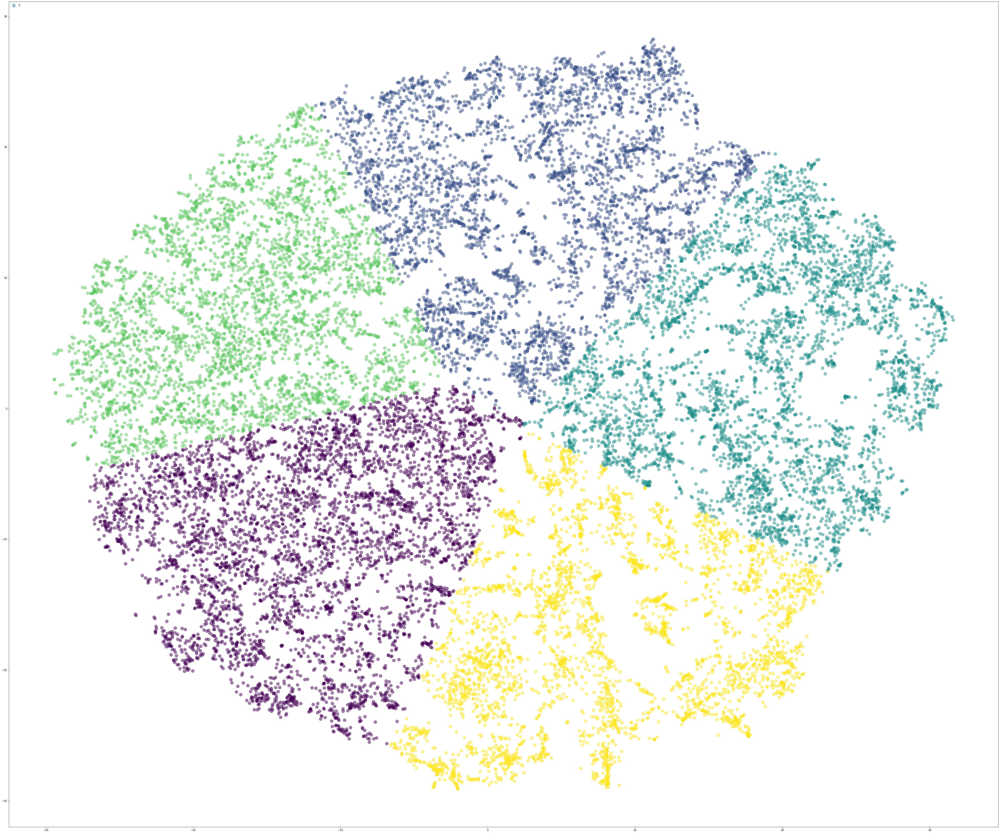

In [43]:
plt.figure(figsize=(70, 60))
plt.scatter(df_w2v['x'], df_w2v['y'],s=150,c=labels_w2v, alpha=0.5)
plt.legend(labels_w2v, loc='upper left')

In [44]:
centroids_df = pd.DataFrame()
for index, value in enumerate(centroids_w2v):
    distances = []
    for ind, val in enumerate(centroids_w2v):
        if cosine(value, val) == 0:
            distances.append(666)
        else: distances.append(cosine(value, val))
    centroids_df[f'centroid {index}'] = distances

In [45]:
centroids_df

,centroid 0,centroid 1,centroid 2,centroid 3,centroid 4
0,666.000000,1.776056,1.857823,0.565639,0.725513
1,1.776056,666.000000,0.658409,0.769025,1.819458
2,1.857823,0.658409,666.000000,1.835536,0.741256
3,0.565639,0.769025,1.835536,666.000000,1.746915
4,0.725513,1.819458,0.741256,1.746915,666.000000


In [46]:
df_w2v['Game'] = list(items.keys())

In [47]:
df_w2v.head()

,x,y,labels,original vectors,Game
0,13.463983,-23.359310,4,"[0.10827714, 0.14570567, 0.020185715, 0.010454...",Zero Suit Samus amiibo - Japan Import (Super S...
1,4.271702,-7.752670,4,"[0.03438973, -0.6498847, 0.66600543, 0.2767444...",Bodycount
2,8.059924,-23.215723,4,"[0.082081966, -0.28815678, 0.053694565, 0.0340...",Guilty Gear Xrd SIGN
3,10.791733,-21.772594,4,"[-0.026848603, -0.098163046, 0.2160481, 0.2516...",Etrian Odyssey IV: Legends of the Titan - Nint...
4,9.747458,-5.278963,2,"[0.015151036, -1.4332457, 1.426357, 0.7577948,...",Dante's Inferno


In [58]:
def closest_cluster_recommendations(input_game, recommend_cluster=None, vector_type=None):
    """
    returns top5 recommendations from selected cluster type
    """
    
    def searching_cluster_list():
        """
        returns list of elements inside nearest or current cluster
        """
        buffer_list = []
        if vector_type=='original':
            for row in buff_df.itertuples():
                buffer_list.append([cosine(w2v_vector_for_search, row.original_vectors), row.Game])
        else:
            for row in buff_df.itertuples():
                buffer_list.append([cosine(w2v_vector_for_search, [row.x, row.y]), row.Game]) 

        return buffer_list
    
    def result_printer():
        """
        returns recommended games according to recommendation strategy
        """
        searching_list = searching_cluster_list()
        searching_list.sort(key=itemgetter(0))
        print(f'Top-5 nearest games for {start}{input_game}{end}:')
        print()
        if searching_list[0][1] == input_game: pprint(searching_list[1:6])
        else: pprint(searching_list[:5])
    
    
    w2v_embs_needed_index = df_w2v.index[df_w2v['Game']==input_game][0]
    
    # his label (cluster num)
    w2v_vector_current_label = df_w2v['labels'][w2v_embs_needed_index]
    
    # his embedding vector
    if vector_type=='original':
        w2v_vector_for_search = df_w2v['original_vectors'][w2v_embs_needed_index]
    else:
        w2v_vector_for_search = df_w2v[['x', 'y']].iloc[w2v_embs_needed_index,:].values.tolist()
        
    # his closest centroid (label)
    closest_centroid = centroids_df[f'centroid {w2v_vector_current_label}'].idxmin()
    
    # selecting which kind of recommendation you want
    if recommend_cluster == 'current':
        # buffer dataframe in specific label
        buff_df = df_w2v[df_w2v['labels']==w2v_vector_current_label]
        result_printer()
        
    else:
        buff_df = df_w2v[df_w2v['labels']==closest_centroid]
        result_printer()

### recommend from current cluster on original vectors

In [59]:
closest_cluster_recommendations("Assassin's Creed 4",recommend_cluster='current', vector_type='original')

Top-5 nearest games for Assassin's Creed 4:

[[0.2770124077796936, 'Watch Dogs'],
 [0.28187334537506104, "Tom Clancy's Splinter Cell Blacklist"],
 [0.2895709276199341, 'Thief'],
 [0.3147141933441162, "Assassin's Creed Ezio Trilogy Edition"],
 [0.3291957974433899, 'Tomb Raider: Definitive Edition']]


In [60]:
model.wv.most_similar(positive="Assassin's Creed 4", topn=5)

[('Watch Dogs', 0.7229875922203064),
 ("Tom Clancy's Splinter Cell Blacklist", 0.7181265950202942),
 ('Thief', 0.7104290723800659),
 ('Pokemon 3DS TPU Silicone Cover EEVEE Umbreon Espeon Flareon Vaporeon Jolteon Case Protector Clear XY',
  0.6872339248657227),
 ("Assassin's Creed Ezio Trilogy Edition", 0.685285747051239)]

In [61]:
closest_cluster_recommendations("LEGO: Marvel",recommend_cluster='current', vector_type='original')

Top-5 nearest games for LEGO: Marvel:

[[0.10085165500640869, 'The LEGO Movie Videogame'],
 [0.10192704200744629, 'LEGO The Hobbit'],
 [0.1292840838432312, 'LEGO Batman 3: Beyond Gotham'],
 [0.14866626262664795, 'The Amazing Spider-Man 2'],
 [0.15643078088760376, 'Angry Birds Star Wars']]


### recommend from nearest cluster on original vectors

In [62]:
closest_cluster_recommendations("Assassin's Creed 4",vector_type='original')

Top-5 nearest games for Assassin's Creed 4:

[[0.38225895166397095, 'Take Two Interactive Spec Ops: The Line - Xbox 360'],
 [0.39003318548202515,
  'Insten Wall AC Charger Compatible With NINTENDO GAMEBOY Advance SP DS NDS'],
 [0.39111989736557007, 'dreamGEAR Universal USB Car Charger'],
 [0.3985757827758789,
  'Skins for PS4 Controller - Decals for Playstation 4 Games - Stickers Cover '
  'for PS4 Slim Sony Play Station Four Controllers PS4 Pro Accessories PS4 '
  'Remote Wireless Dualshock 4 Skin - Blue Daemon'],
 [0.40337038040161133, 'The Darkness II Limited Edition']]


In [63]:
closest_cluster_recommendations("LEGO: Marvel",vector_type='original')

Top-5 nearest games for LEGO: Marvel:

[[0.22928977012634277,
  'Xett Multimedia Horizontal Stand With 3 X Cooling Fans For Sony Ps3 / Ps3 '
  'Slim / Xbox 360 / Notebook / Laptop Computer (290Mm By 240Mm)'],
 [0.2642689347267151,
  'Sony PlayStation 4 PS4 Screen Protector, IQ Shield® LiQuidSkin Full Body '
  'Skin + Full Coverage Screen Protector for Sony PlayStation 4 PS4 HD Clear '
  'Anti-Bubble Film - with Lifetime Warranty'],
 [0.2715908885002136,
  'Spiderman Amazing Spider-Man Superhero Movie Game Vinyl Decal Sticker Cover '
  'Skin Protector #4 for Sony PSP Slim 3000 3001 3002 3003 3004 Playstation '
  'Portable'],
 [0.2716028094291687, 'Nintendo Official and LEGO Game Cases for DS'],
 [0.2731601595878601,
  'SmaAcc Dual-Channel Charging Station for PS4 Controller/DualShock 4 '
  'Wireless Controller']]


### recommend from current cluster on cutted vectors

In [64]:
closest_cluster_recommendations("Assassin's Creed 4", recommend_cluster='current')

Top-5 nearest games for Assassin's Creed 4:

[[1.0730305533002138e-12, 'Wolfenstein: The New Order'],
 [5.310338713204743e-08,
  'Super Grip Premium Silicone Skin for Sony Playstation 3 PS3 Remote (Blue)'],
 [9.19240067398519e-08,
  'PS3 Azurite 250GB System with PlayStation All-Stars Battle Royale Bundle'],
 [2.6377091810747544e-07, 'PDP Disney Infinity 2.0 Play Zone'],
 [3.2444271735876384e-07, 'Escape Dead Island']]


In [65]:
closest_cluster_recommendations("LEGO: Marvel", recommend_cluster='current')

Top-5 nearest games for LEGO: Marvel:

[[1.4326695385591393e-10, 'Nintendo 3DS Microsuede Touch Pak'],
 [9.964320257793702e-09, 'Ultimate Portable Game Player'],
 [1.036514130081656e-08, 'LEGO Batman 3: Beyond Gotham'],
 [9.816782353677667e-08,
  'eForCity® 2in1 Clear LCD Screen Protector Cover Compatible With Nintendo '
  '3DS'],
 [2.4097553985580333e-07, '20in1 Essentials Kit For your 3DS XL']]


### recommend from nearest cluster on cutted vectors

In [66]:
closest_cluster_recommendations("Assassin's Creed 4")

Top-5 nearest games for Assassin's Creed 4:

[[0.0004256826560717908,
  'PlayStation Portable Limited Edition Madden NFL 11 Entertainment Pack - '
  'Piano Black'],
 [0.0006407356444994017, 'Luxor 5 Anniversary Edition - PC'],
 [0.0007555407905488476, 'Imagine: Detective - Nintendo DS'],
 [0.0009591551580288016, 'Zenses: Zen Garden - Nintendo DS'],
 [0.0013327118724207887, 'Petz Saddle Club - Sony PSP']]


In [67]:
closest_cluster_recommendations("LEGO: Marvel")

Top-5 nearest games for LEGO: Marvel:

[[1.761454564985776e-06,
  'Microsoft 2 Prong Power Cord for Xbox 360 Jasper, Falcon and Slim model '
  'Power Adapter (Bulk Packaging)'],
 [5.822746035777371e-06, 'Universal RFU Adapter'],
 [3.6371478963181936e-05, 'Konami Classics Volume 2 - Xbox 360'],
 [9.70319161416322e-05, 'Air Conflicts: Aces of World War II - Sony PSP'],
 [0.0007655764885001748,
  'Neewer 32MB 32 MB Memory Card for SONY PS2 Playstation2 PS 2']]


## Experimenting again

In [83]:
memory_usage()

RAM used in GB: 1.714


In [49]:
testing_model = gensim.models.Word2Vec(bought_items_list, size=150, window=40, min_count=53, workers=cores-1)

testing_model.train(train, total_examples=len(train), epochs = 10)

(2651255, 4376780)

### model.wv.most_similar - method

In [50]:
cnt = 0
not_in_vocab = 0
for index, check in enumerate(masked_test):
    check_len = len(check)
    try:
        # converting list of game names to list of vectors
        check_list = [items[item] for item in check]
        
        # clustering check 
        db_labels = DBSCAN(eps=3,min_samples=2, n_jobs=-1).fit_predict(check_list)
        
        # getting num of clusters
        num_clusters = len(set(db_labels))
        
        # using num_clusters to kmeans algorithm
        kmeans = KMeans(n_clusters=num_clusters, n_jobs=-1)
        km_labels = kmeans.fit_predict(check_list)
        
        # getting each clusters centers
        centroids = kmeans.cluster_centers_
        
        # creating dict of cluster frequencies
        freq_dict= defaultdict( int )
        for label in km_labels:
            freq_dict[label] += 1
            
        # depenging on cluster size, getting recommendations for each cluster and merge it in overall
        # 10 items recommendation list
        recommendation_list = []
        for ind, center in enumerate(centroids):
            # calculating weight for every cluster recommendation
            recommendation_weight = round((freq_dict[ind] / check_len)*10)
            
            # getting recommendation for cluster with specific weight
            cluster_recommendation = testing_model.wv.most_similar([center], topn=recommendation_weight)
            
            # extracting game name
            for rec in cluster_recommendation:
                recommendation_list.append(rec[0])
                
        # checking for masked game presence in our recommendation list
        if masks[index] in recommendation_list:
            cnt += 1
    except:
        not_in_vocab+=1
        
print(cnt / (len(masked_test)-not_in_vocab))

0.0028024287716020553


### model.similar_by_vector - method

In [51]:
cnt = 0
for index, check in enumerate(masked_test):
    check_len = len(check)
    try:
        # converting list of game names to list of vectors
        check_list = [items[item] for item in check]
        
        # clustering check 
        db_labels = DBSCAN(eps=3,min_samples=2, n_jobs=-1).fit_predict(check_list)
        
        # getting num of clusters
        num_clusters = len(set(db_labels))
        
        # using num_clusters to kmeans algorithm
        kmeans = KMeans(n_clusters=num_clusters, n_jobs=-1)
        km_labels = kmeans.fit_predict(check_list)
        
        # getting each clusters centers
        centroids = kmeans.cluster_centers_
        
        # creating dict of cluster frequencies
        freq_dict= defaultdict( int )
        for label in km_labels:
            freq_dict[label] += 1
            
        # depenging on cluster size, getting recommendations for each cluster and merge it in overall
        # 10 items recommendation list
        recommendation_list = []
        for ind, center in enumerate(centroids):
            # calculating weight for every cluster recommendation
            recommendation_weight = round((freq_dict[ind] / check_len)*10)
            
            # getting recommendation for cluster with specific weight
            cluster_recommendation = testing_model.similar_by_vector(center, topn=recommendation_weight)
            
            for rec in cluster_recommendation:
                recommendation_list.append(rec[0])
        if masks[index] in recommendation_list:
            cnt += 1
    except:
        pass

In [52]:
cnt / (len(masked_test)-not_in_vocab)

0.0028024287716020553

### recommends on most_similar method, without supplementary clustering

In [53]:
cnt = 0
not_in_vocab = 0

for index, check in enumerate(masked_test):
    check_len = len(check)
    try:
        if index % 1000 == 0: print(f'{index} checks were proc')
        # converting list of game names to list of vectors
        check_list = [items[item] for item in check]

        # clustering check 
        db_labels = DBSCAN(eps=3,min_samples=2, n_jobs=-1).fit_predict(check_list)

        # getting num of clusters
        num_clusters = len(set(db_labels))

        # creating dict of cluster frequencies
        freq_dict= defaultdict( int )

        # creating dict of cluster vectors
        clust_dict = {}

        for ids, label in enumerate(db_labels):
            freq_dict[label] += 1
            
            # insert vectors in clust dict with exactly the same db label key
            if label not in clust_dict.keys():
                clust_dict[label] = [check_list[ids]]

            else:
                clust_dict[label].append(check_list[ids])

        recommendation_list = []

        for key, value in clust_dict.items():
            # create list of recommendations with specific weight
            recommendation = testing_model.most_similar(value, topn=round((freq_dict[key] / check_len) * 10))

            # extract games name
            for recom in recommendation:
                recommendation_list.append(recom[0])
                
                
        # checking presence of our mask in recommendation list
        if masks[index] in recommendation_list:
            cnt += 1
            
    except:
        
        not_in_vocab += 1

0 checks were proc
1000 checks were proc
2000 checks were proc
3000 checks were proc
4000 checks were proc
5000 checks were proc
6000 checks were proc
7000 checks were proc
8000 checks were proc
9000 checks were proc
10000 checks were proc
11000 checks were proc
12000 checks were proc
13000 checks were proc
14000 checks were proc


In [54]:
cnt / (len(masked_test)-not_in_vocab)

0.0027245835279464427

### быдло рекомендашки без кластеризации на названиях игр

In [137]:
cnt = 0
not_in_vocab = 0
for ind, val in enumerate(tqdm(masked_test)):
    try:
        predicts = testing_model.most_similar(val, topn=10)
        results = [i[0] for i in predicts]
        if masks[ind] in results:
            cnt +=1
    except: 
        not_in_vocab +=1

100%|██████████| 14387/14387 [00:08<00:00, 1664.33it/s]


In [138]:
(cnt / (len(masked_test)-not_in_vocab))

0.10484330484330484

In [139]:
cnt, not_in_vocab

(368, 10877)

In [105]:
memory_usage()

RAM used in GB: 1.41


In [170]:
def check_to_average(user_check, vector_size):
    
    avg = np.zeros((vector_size,))
    for check in user_check:
        avg += items[check]
    avg = avg / len(user_check)
    
    return avg

In [157]:
%%time
cnt = 0
not_in_vocab = 0

for ind, val in enumerate(tqdm(masked_test)):
    
    try:
        check = check_to_average(val)
        predict = testing_model.most_similar(positive = [check], topn=10)
        results = [i[0] for i in predict]
        if masks[ind] in results:
            cnt +=1
        
    except:
        not_in_vocab+=1

#     #if masks[ind] in [i[0] for i in output_list[:10]]:
#         #cnt += 1

#     #not_in_vocab += 1

100%|██████████| 14387/14387 [00:05<00:00, 2488.28it/s]

CPU times: user 1.65 s, sys: 0 ns, total: 1.65 s
Wall time: 5.8 s


In [158]:
(cnt / (len(masked_test)-not_in_vocab))

ZeroDivisionError: division by zero

## Get embeddings from keras layer

In [254]:
def closest_embs_finder(game_name):
    res = []
    for i in all_items:
        res.append(np.linalg.norm(np.array(df.loc[game_name,:].values[:2].tolist())-np.array(df.loc[i,:].values[:2].tolist())))
    buff_df = pd.DataFrame(data = res, columns = ['val'])
    buff_df['games'] = all_items
    buff_df = buff_df[buff_df.games != game_name]
    return buff_df.sort_values(by = 'val', ascending=True).head()

In [432]:
all_items = list(set([item for item_list in bought_items_list for item in item_list]))

In [27]:
vocab_size = 35982
encoded_docs = [one_hot(item, vocab_size) for item in all_items]

In [28]:
max_length = 1
padded_docs = pad_sequences(encoded_docs, maxlen=max_length, padding='post')
pprint(padded_docs)

array([[ 1520],
       [31681],
       [ 2553],
       ...,
       [16647],
       [19751],
       [15382]], dtype=int32)


In [33]:
model = Sequential()
model.add(Embedding(vocab_size, 32, input_length=1))
model.add(Flatten())
model.add(Dense(1, activation='sigmoid'))
# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
# summarize the model
print(model.summary())

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 1, 32)             1151424   
_________________________________________________________________
flatten_1 (Flatten)          (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 1,151,457
Trainable params: 1,151,457
Non-trainable params: 0
_________________________________________________________________
None


In [34]:
get_embed_layer_output = K.function([model.layers[0].input],
                                  [model.layers[0].output])

layer_output = get_embed_layer_output([padded_docs])[0]

In [35]:
layer_output = np.array([i[0] for i in layer_output])

In [36]:
tsne = TSNE(n_components=2,random_state=1, n_iter=500, metric="cosine")

In [37]:
embs = tsne.fit_transform(layer_output)

In [178]:
kmeans = KMeans(n_clusters=5, n_jobs=-1, max_iter=3000)
labels = kmeans.fit_predict(embs)

In [185]:
df = pd.DataFrame()
df['Video Game'] = all_items
df['x1'] = embs[:,0]
df['x2'] = embs[:,1]
df['label'] = labels
df.set_index('Video Game', inplace=True)

### RNN model to predict mask

In [250]:
train, test = train_test_split(bought_items_list, test_size=0.2, random_state=666)

In [265]:
masked_train, masks_train = masker(train)

In [264]:
masked_test, masks_test = masker(test)

In [272]:
maxLen = len(max(masked_train, key=len))
maxLen

867

In [273]:
def convert_to_one_hot(Y, C):
    Y = np.eye(C)[Y.reshape(-1)]
    return Y

In [276]:
masks_train = np.array(masks_train)

In [302]:
masks_test = np.array(masks_test)

In [303]:
enc = OneHotEncoder(handle_unknown='ignore')
Y_oh_train_masks = enc.fit_transform(masks_train.reshape(-1,1)).toarray()
Y_oh_test_masks = enc.transform(masks_test.reshape(-1,1)).toarray()

In [298]:
len(masks_train)

57548

In [288]:
Y = enc.fit_transform(X).toarray()

In [283]:
masks_train.reshape(-1)

array(['Fintastic Fishdom 3 Game Collection',
       'Resident Evil Archives: Resident Evil Zero',
       'Time Crisis: Razing Storm - Playstation 3', ...,
       'The Legend of Zelda: Ocarina of Time 3D',
       '2 X Zapper GUN for Nintendo Wii Wireless Remote Controller Game',
       'Pro Elite Wireless Controller for PS3'], dtype='<U358')

In [278]:
Y_oh_train = convert_to_one_hot(masks_train, C = 5)

IndexError: arrays used as indices must be of integer (or boolean) type

In [ ]:
def pretrained_embedding_layer(word_to_vec_map, word_to_index):
    """
    Creates a Keras Embedding() layer and loads in pre-trained GloVe 50-dimensional vectors.
    
    Arguments:
    word_to_vec_map -- dictionary mapping words to their GloVe vector representation.
    word_to_index -- dictionary mapping from words to their indices in the vocabulary (400,001 words)

    Returns:
    embedding_layer -- pretrained layer Keras instance
    """
    
    vocab_len = len(word_to_index) + 1                  # adding 1 to fit Keras embedding (requirement)
    emb_dim = word_to_vec_map["cucumber"].shape[0]      # define dimensionality of your GloVe word vectors (= 50)
    
    ### START CODE HERE ###
    # Initialize the embedding matrix as a numpy array of zeros of shape (vocab_len, dimensions of word vectors = emb_dim)
    emb_matrix = np.zeros((vocab_len, emb_dim))
    
    # Set each row "index" of the embedding matrix to be the word vector representation of the "index"th word of the vocabulary
    for word, index in word_to_index.items():
        emb_matrix[index, :] = word_to_vec_map[word]

    # Define Keras embedding layer with the correct output/input sizes, make it non-trainable. Use Embedding(...). Make sure to set trainable=False. 
    embedding_layer = Embedding(input_dim = vocab_len, output_dim=emb_dim, trainable=False)
    ### END CODE HERE ###

    # Build the embedding layer, it is required before setting the weights of the embedding layer. Do not modify the "None".
    embedding_layer.build((None,))
    
    # Set the weights of the embedding layer to the embedding matrix. Your layer is now pretrained.
    embedding_layer.set_weights([emb_matrix])
    
    return embedding_layer


def rec_model(input_shape, word_to_vec_map, word_to_index):
    """
    Function creating the Emojify-v2 model's graph.
    
    Arguments:
    input_shape -- shape of the input, usually (max_len,)
    word_to_vec_map -- dictionary mapping every word in a vocabulary into its 50-dimensional vector representation
    word_to_index -- dictionary mapping from words to their indices in the vocabulary (400,001 words)

    Returns:
    model -- a model instance in Keras
    """
    
    ### START CODE HERE ###
    # Define sentence_indices as the input of the graph, it should be of shape input_shape and dtype 'int32' (as it contains indices).
    sentence_indices = Input(shape=input_shape, dtype='int32')
    
    # Create the embedding layer pretrained with GloVe Vectors (≈1 line)
    embedding_layer = pretrained_embedding_layer(word_to_vec_map, word_to_index)
    
    # Propagate sentence_indices through your embedding layer, you get back the embeddings
    embeddings = embedding_layer(sentence_indices)  
    
    # Propagate the embeddings through an LSTM layer with 128-dimensional hidden state
    # Be careful, the returned output should be a batch of sequences.
    X = LSTM(128, return_sequences=True)(embeddings)
    # Add dropout with a probability of 0.5
    X = Dropout(0.5)(X)
    # Propagate X trough another LSTM layer with 128-dimensional hidden state
    # Be careful, the returned output should be a single hidden state, not a batch of sequences.
    X = LSTM(128, return_sequences=False)(X)
    # Add dropout with a probability of 0.5
    X = Dropout(0.5)(X)
    # Propagate X through a Dense layer with softmax activation to get back a batch of 5-dimensional vectors.
    X = Dense(5, activation='softmax')(X)
    # Add a softmax activation
    X = Activation('softmax')(X)
    
    # Create Model instance which converts sentence_indices into X.
    model = Model(inputs=sentence_indices, outputs=X)
    
    ### END CODE HERE ###
    
    return model

### kinda huinia odnako

In [257]:
closest_embs_finder("LEGO: Marvel")

,val,games
18541,0.000000,Disney Infinity 2.0 Power Disc - Marvel Team-U...
32663,0.140035,50 Cent: Bulletproof
27341,0.275650,Mat Hoffman's Pro BMX
16113,0.275650,Dave Mirra Freestyle BMX
23519,0.275650,Dave Mirra FreeStyle BMX


In [259]:
closest_embs_finder("NBA 2K10")

,val,games
18057,0.000000,MLB 2K10
25420,0.000000,NHL 2K10
7594,0.227301,18 Wheels of Steel Haulin
10970,0.227301,Yu-Gi-Oh! Capsule Monster Coliseum
28044,0.249590,Virtual Villagers: A New Home / The Lost Children


In [270]:
closest_embs_finder('Bloodborne')

,val,games
16573,0.069967,Skylanders SWAP FORCE LOOSE Figure Battle Hammer
12556,0.118737,V Smile Game in Spanish - Spider Man - Spiderm...
22829,0.178716,Elder Scrolls IV: Oblivion
18530,0.178716,The Elder Scrolls IV: Oblivion
3727,0.178716,Oblivion


In [265]:
closest_embs_finder('The Last of Us')

,val,games
32699,4.768372e-07,Inspirationc® New 5pcs Colors Stylus Touch Pen...
1537,9.536743e-07,INJUSTICE:GODS AMONG US
9688,9.536743e-07,Theo&Cleo New 4pcs Colors Stylus Touch Pen For...
19230,9.536743e-07,PS3 250GB HW BUNDLE BLK FRIDAY 2012 US
1074,9.536743e-07,Neewer Silicone Skin Case Cover For SONY PSP 3...


### okay, these embeddings have learned to symbolically distinguish

In [262]:
closest_embs_finder('Grand Theft Auto V')

,val,games
34133,0.000108,Smash T.V.
32405,0.000108,Double Dragon V
20516,0.000108,Armored Core V
27821,0.000108,Mega Man V
16313,0.000108,Gradius V


In [267]:
closest_embs_finder('Call of Duty: Black Ops II')

,val,games
34469,0.001479,SWORD OF HOPE II
927,0.001587,Icewind Dale II
18029,0.001810,Lego Star Wars II
24768,0.002317,Army Men: Freedom Pack (Army Men / Army Men II)
29,0.002564,Red Baron II


In [263]:
closest_embs_finder('Call of Duty: Ghosts')

,val,games
2646,0.000444,Xbox One modded controller with Trigger Stops ...
3416,0.000631,Ghouls 'N Ghosts
30332,0.001002,TQS&#153; Designer Skin Sticker for Xbox One C...
10529,0.001119,Super Ghouls'n Ghosts
19982,0.001377,Designer XBOX One Vinyl Decal Call of Duty Ghosts


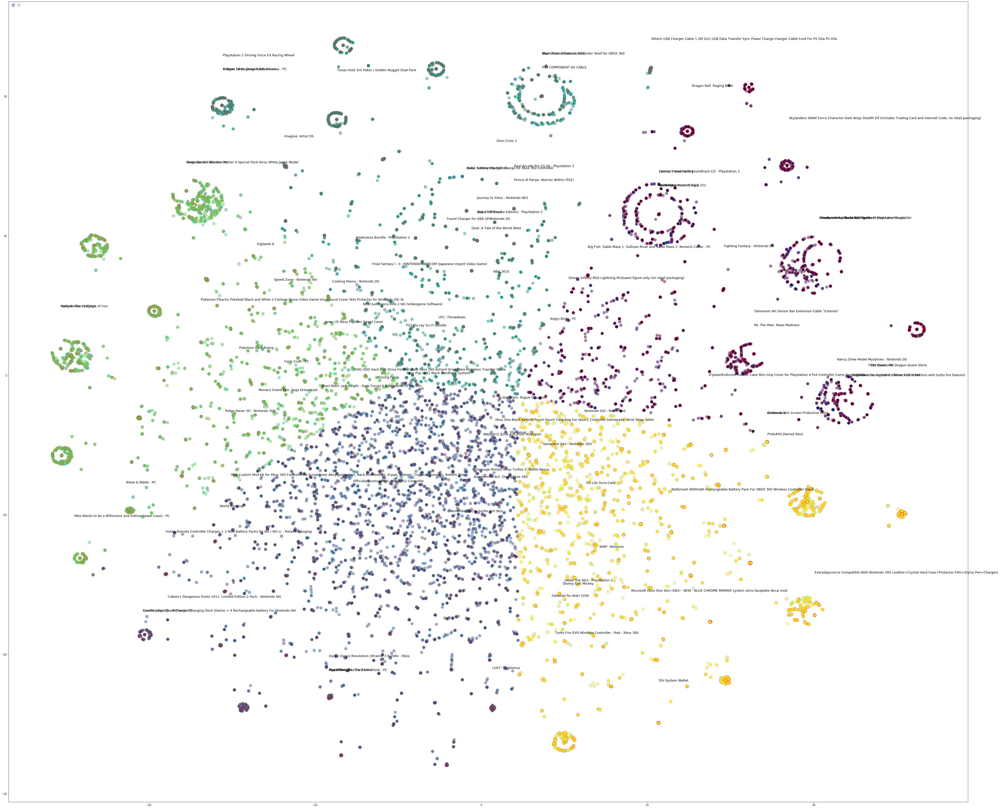

In [182]:
plt.figure(figsize=(70, 60), dpi=d)
plt.scatter(df['x1'], df['x2'],s=150,c=kmeans.labels_.astype(float), alpha=0.5, edgecolor=colors)
for ind, item in enumerate(all_items[500:600]):
    plt.annotate(item,fontsize = 13,
            xy=(embs[ind][0], embs[ind][1]), xytext=(embs[ind][0], embs[ind][1]+random.randint(2,3)))
plt.legend(labels, loc='upper left')
plt.savefig('shit_clusters.pdf')

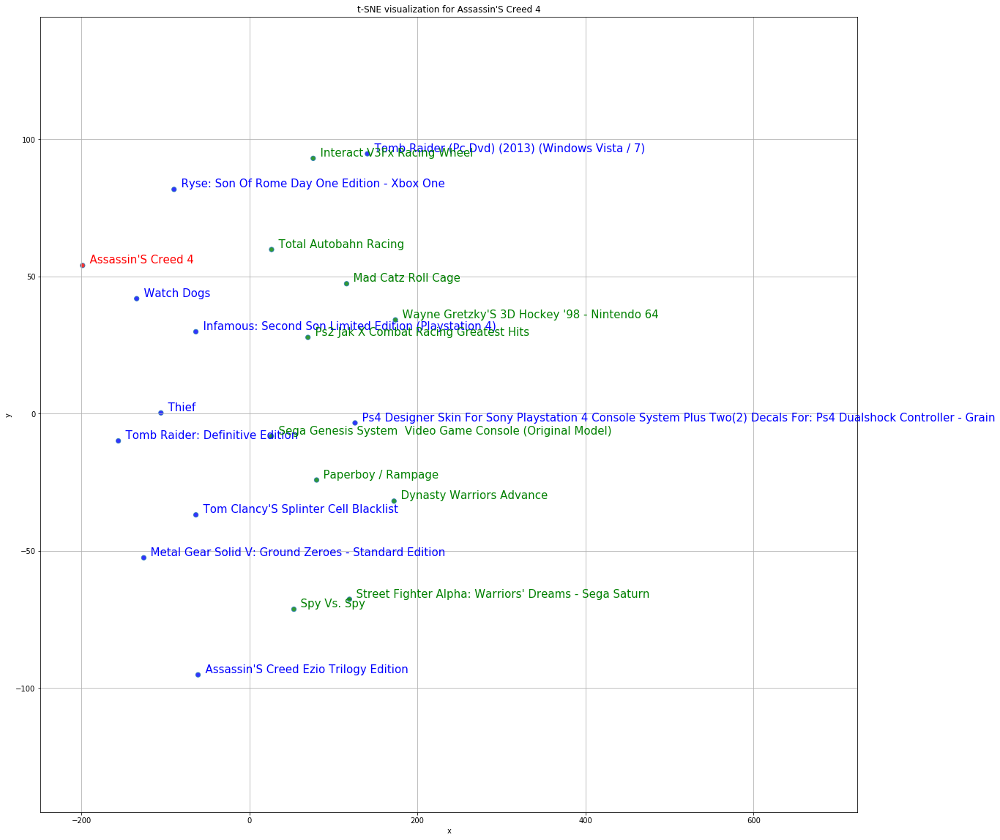

In [723]:
tsnescatterplot(model, "Assassin's Creed 4", [i[0] for i in model.wv.most_similar(negative=["Assassin's Creed 4"])])